# Рынок заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Для начала они просят меня — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Мне доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года.

### Загрузка данных и изучение общей информации

In [1]:
import pandas as pd
from datetime import datetime
from matplotlib import pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster

In [2]:
data = pd.read_csv("/datasets/moscow_places.csv")
data.head(5)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Выгружен датасет с следующими данными:
0. name — название заведения;
1. address — адрес заведения;
2. category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
3. hours — информация о днях и часах работы;
4. lat — широта географической точки, в которой находится заведение;
5. lng — долгота географической точки, в которой находится заведение;
6. rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
7. price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
8. avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽».
и так далее;
9. middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
10. middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
11. chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым
12. district — административный район, в котором находится заведение, например Центральный административный округ;
13. seats — количество посадочных мест.

В выгруженном датасете представлены данные о 8406 заведениях, но не по всем заведениям есть полная характеристика.

### Предобработка данных

In [4]:
data.duplicated().sum()

0

Дубликатов данных не обнаружено. Названия заведений могут совпадать, например если сетевые заведения или заведения разных категорий.

In [5]:
data['name']= data['name'].str.lower()
data['address']= data['address'].str.lower()
print('Дубликатов с одинаковым названием и одинаковым адресом:',data.duplicated(subset=['name','address']).sum())
data  = data.drop_duplicates(subset=['name','address'])
print('Дубликатов с одинаковым названием и одинаковым адресом после удаления:',data.duplicated(subset=['name','address']).sum())

Дубликатов с одинаковым названием и одинаковым адресом: 4
Дубликатов с одинаковым названием и одинаковым адресом после удаления: 0


Cделана проверка на дубликаты  по полям 'name' и 'address'(после приведения их к нижнему регистру), найдено 4 дубликата, они удалены. 

In [6]:
data.isna().sum()
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8402 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              7867 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   int64  
 13  seats              4792 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 984.6+ KB


Обнаружены пропуски данных, оставлены как есть, учитывая большую долю пропусков. Таким образом в дальнейшем будет анализироватся информация о 8402 заведениях.

In [7]:
street = data['address'].str.split(pat = (', '), expand = True)
data.insert(loc=14, column = 'street', value = street[1])
data['is_24_7'] = data['hours'].apply(lambda x: True if x == 'ежедневно, круглосуточно' or x == 'ежедневно, 00:00–24:00' else False)
data.tail(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
8403,самовар,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0,люблинская улица,True
8404,чайхана sabr,кафе,"москва, люблинская улица, 112а, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0,люблинская улица,True
8405,kebab time,кафе,"москва, россошанский проезд, 6",Южный административный округ,"ежедневно, круглосуточно",55.598229,37.604702,3.9,NaN,NaN,NaN,NaN,0,12.0,россошанский проезд,True


In [8]:
#Код ревьюера
data.query('street == "проспект Мира"')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7


In [9]:
data.query('street == "проспект мира"').head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
718,все лень,ресторан,"москва, проспект мира, 119, стр. 528",Северо-Восточный административный округ,"пн-чт 12:00–21:00; пт,сб 12:00–22:00; вс 12:00...",55.836107,37.614875,4.4,выше среднего,Средний счёт:от 1500 ₽,1500.0,NaN,0,NaN,проспект мира,False
786,старое место,кафе,"москва, проспект мира, 119, стр. 504",Северо-Восточный административный округ,"ежедневно, 11:00–22:00",55.837212,37.616469,4.1,средние,Средний счёт:900–1100 ₽,1000.0,NaN,0,NaN,проспект мира,False
792,doner one,кафе,"москва, проспект мира, 119, стр. 596",Северо-Восточный административный округ,"ежедневно, 11:00–21:00",55.839037,37.613027,4.2,NaN,NaN,NaN,NaN,0,NaN,проспект мира,False


Создан столбец street с названиями улиц из столбца с адресом, создан столбец is_24_7 ( True - круглосуточная работа заведения, False - нет)

***Выводы по предобработке данных***
1. Явных дубликатов данных не обнаружено. Названия заведений могут совпадать, например если сетевые заведения или заведения разных категорий.
2. Cделана проверка на неявные дубликаты по полям 'name' и 'address'(после приведения их к нижнему регистру), найдено 4 дубликата, они удалены.
3. Обнаружены пропуски данных, оставлены как есть, учитывая большую долю пропусков. Таким образом в дальнейшем будет анализироватся информация о 8402 заведениях.
4. Создан столбец street с названиями улиц из столбца с адресом, создан столбец is_24_7 ( True - круглосуточная работа заведения, False - нет)

### Анализ данных

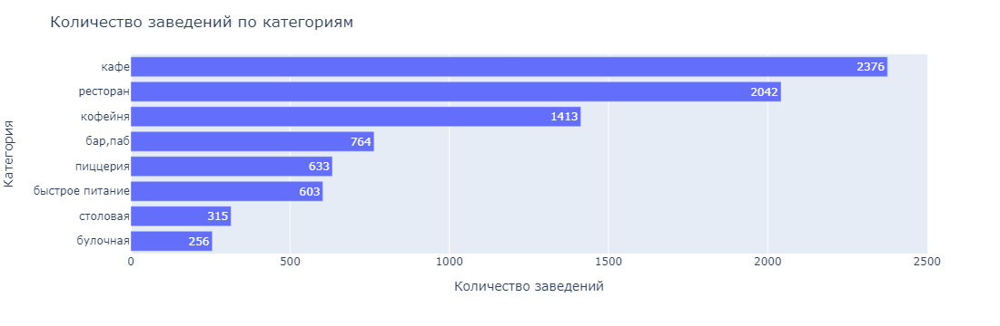

In [10]:
d1 = data.groupby('category')[['category']].count()
d1.columns = ['total_count']
d1 = d1.reset_index().sort_values(by='total_count', ascending=False)
fig = px.bar(d1.sort_values(by='total_count', ascending=True), # загружаем данные и заново их сортируем
             x='total_count', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='total_count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Количество заведений по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория')
fig.show() # выводим график

Количество заведений по категориям.Всех больше кафе и ресторанов, на 3 месте кофейни.

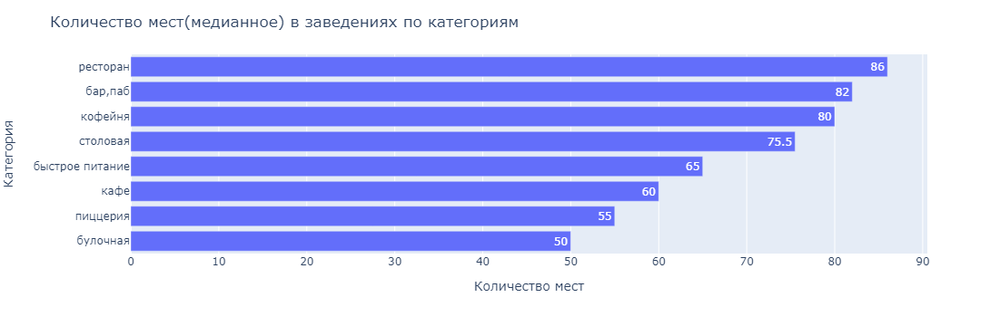

In [11]:
d1 = data.groupby('category')[['seats']].median()
d1.columns = ['total_seat']
d1 = d1.reset_index().sort_values(by='total_seat', ascending=False)
fig = px.bar(d1.sort_values(by='total_seat', ascending=True), # загружаем данные и заново их сортируем
             x='total_seat', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='total_seat' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Количество мест(медианное) в заведениях по категориям',
                   xaxis_title='Количество мест',
                   yaxis_title='Категория')
fig.show() # выводим график

Количество мест в заведениях по категориям.Всех больше в ресторанах и кафе, на 3 месте кофейни.

In [12]:
d1 = pd.DataFrame(data['chain'].value_counts()).reset_index()
d1['index'] = d1['index'].apply(lambda x: 'сетевые' if x == 1 else 'несетевые')
fig = go.Figure(data=[go.Pie(labels=d1['index'], # указываем значения, которые появятся на метках сегментов
                             values=d1['chain'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Сетевые и несетевые заведения', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Количество заведений',
                                    showarrow=False)])
fig.show() # выводим график

Несетевых заведений больше, чем сетевых.

In [13]:

d1 = data.query('chain == 1').groupby('category')[['category']].count()/data.groupby('category')[['category']].count()
d1.columns = ['total_count']
d1 = d1.reset_index().sort_values(by='total_count', ascending=False)
fig = px.bar(d1.sort_values(by='total_count', ascending=True), # загружаем данные и заново их сортируем
             x='total_count', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='total_count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Доля сетевых заведений по категориям',
                   xaxis_title='Доля заведений',
                   yaxis_title='Категория')
fig.show() # выводим график

Сетевые заведения характерны для булочных, затем для пиццерий и кофейнь.

In [14]:
d1 = data.query('chain == 1').groupby('name')[['name']].count()
d1.columns = ['total_count']
d1 = d1.reset_index().sort_values(by='total_count', ascending=False).head(15)
fig = px.bar(d1.sort_values(by='total_count', ascending=True), # загружаем данные и заново их сортируем
             x='total_count', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             text='total_count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='ТОП-15 сетей',
                   xaxis_title='Количество заведений',
                   yaxis_title='Сеть')
fig.show() # выводим график

Самые популярные сети - это сети кофеен и пиццерий. Лидер - кофейня Шоколадница.

In [15]:
d1 = data.query('chain == 1').groupby(('name'),as_index = False)[['address']].count()

d1.columns = ['name','total_count']
d1 = d1.sort_values(by='total_count', ascending=False).head(15)
a = d1['name']

d2 = data.query('name in @a').groupby('category')[['name']].count()/data.groupby('category')[['name']].count()

d2.columns = ['dolya']
d2 = d2.reset_index().sort_values(by='dolya', ascending=False)
fig = px.bar(d2.sort_values(by = 'dolya',ascending=True), # загружаем данные и заново их сортируем
             x='dolya', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='dolya' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Доля ТОП-15 сетей по категориям',
                   xaxis_title='Доля',
                   yaxis_title='Категория')
fig.show() # выводим график

Доля ТОП-15 сетей по категориям наибольшая среди пиццерий. Кофейни также имеют большую долю.

In [16]:
d1 = data.groupby(['district'])['name'].count()
d2 = pd.pivot_table(data, index = 'district', values = 'name' , columns = 'category', aggfunc = 'count').reset_index()
print('Общее количество заведений по округам:')
display(d1.sort_values(ascending=False))
print('Количество заведений в округах по категориям:')
display(d2.sort_values(by='district', ascending=True))
fig = px.bar(d2.sort_values(by='district', ascending=False), # загружаем данные и заново их сортируем
             x= ['бар,паб','булочная','быстрое питание','кафе','кофейня','пиццерия','ресторан','столовая'], # указываем столбец с данными для оси X
             y='district', # указываем столбец с данными для оси Y           
            )
# оформляем график
fig.update_layout(title='Количество заведений по округам(с категориями)',
                   xaxis_title='Количество заведений',
                   yaxis_title='Округа')
fig.show()



Общее количество заведений по округам:


district
Центральный административный округ         2242
Северный административный округ             898
Южный административный округ                892
Северо-Восточный административный округ     890
Западный административный округ             850
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: name, dtype: int64

Количество заведений в округах по категориям:


category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,53,25,71,272,105,72,160,40
1,Западный административный округ,50,37,62,238,150,71,218,24
2,Северный административный округ,68,39,58,234,193,77,188,41
3,Северо-Восточный административный округ,62,28,82,269,159,68,182,40
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18
5,Центральный административный округ,364,50,87,464,428,113,670,66
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17
8,Южный административный округ,68,25,85,264,131,73,202,44


Всех больше заведений в ЦАО как суммарно, так и по каждой категории. Всех меньше в СЗАО.

In [17]:
d1 = data.groupby(['category'],as_index = False)['rating'].mean()
d1 = d1.reset_index()
fig = px.bar(d1.sort_values(by='rating', ascending=True), # загружаем данные и заново их сортируем
             x='rating', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='rating' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Средние рейтинги по категориям заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория')
fig.show() # выводим график

Усредненные рейтинги не сильно отличаются в разных заведениях общещепита, однако можно заметить , что бары пользуются самым высоким рейтингом, а самым низким быстрое питание. Видимо связано с тем с эмоциями от посещения, бары как правило посещают в свободное время и с употреблением алкоголя, быстрое питание же обычно по необходимости.

In [18]:
rating_data = data.groupby('district', as_index=False)['rating'].agg('mean')
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Согласно фоновой картограмме (хороплету) со средним рейтингом заведений каждого округа наивысшие рейтинги в ЦАО, что естественно,учитывая престижность округа и заведений в нем. 

In [19]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Отображены все заведения датасета на карте с помощью кластеров средствами библиотеки folium

In [20]:
d1 = data.groupby(['street'],as_index = False)['name'].agg('count')
d1 = d1.sort_values(by = 'name',ascending = False).head(15)
a = d1['street']
data1 = data.query('street in @a')

d2 = pd.pivot_table(data1, index = 'street', values = 'name' , columns = 'category', aggfunc = 'count').reset_index()
print('Топ-15 улиц по количеству заведений:')
d1.columns = ['street','count']
d1.reset_index(drop= True , inplace= True )
display(d1.sort_values(by= 'count',ascending=False))
fig = px.bar(d2.sort_values(by='street', ascending=False), # загружаем данные и заново их сортируем
             x= ['бар,паб','булочная','быстрое питание','кафе','кофейня','пиццерия','ресторан','столовая'], # указываем столбец с данными для оси X
             y='street', # указываем столбец с данными для оси Y           
            )
# оформляем график
fig.update_layout(title='Топ-15 улиц по количеству заведений с заведениями по категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Улицы')
fig.show()

Топ-15 улиц по количеству заведений:


,street,count
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,76
8,ленинградское шоссе,70
9,мкад,65


Самая насыщенная по количеству заведений улица - проспект Мира. В топ-15 улиц по количеству заведений много кафе, ресторанов и кофеен.

In [21]:
d1 = data.groupby(['street'],as_index = False)['name'].count()
d1 = d1.query('name == 1')
a = d1['street']
data1 = data.query('street in @a')
d2 = data1.groupby('category')[['name']].count()
d2.columns = ['total_count']
d2 = d2.reset_index().sort_values(by='total_count', ascending=False).head(15)
fig = px.bar(d2.sort_values(by='total_count', ascending=True), # загружаем данные и заново их сортируем
             x='total_count', # указываем столбец с данными для оси X
             y='category', # указываем столбец с данными для оси Y
             text='total_count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Количество заведений по категориям на улицах с 1 заведением',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория')
fig.show() # выводим график

На улицах с одним заведением как правило чаще это заведение кафе, потом ресторан и кофейня.

In [22]:
rating_data = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')

display(rating_data)

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Ценовые индикаторы округов по медианному чеку',
).add_to(m)

# выводим карту
m

,district,middle_avg_bill
0,Восточный административный округ,575.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


Медианный чек заведений зависит от престижности района Москвы -ЦАО и ЗАО, потом СЗАО и САО.

In [23]:
a = data['middle_avg_bill'].agg('mean')
data1 = data.query('middle_avg_bill >= @a')
d1 = pd.DataFrame(data1['chain'].value_counts()).reset_index()
d1['index'] = d1['index'].apply(lambda x: 'сетевые' if x == 1 else 'несетевые')
fig = go.Figure(data=[go.Pie(labels=d1['index'], # указываем значения, которые появятся на метках сегментов
                             values=d1['chain'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Cетевые и несетевые заведения c чеком выше среднемосковского', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Количество заведений',
                                    showarrow=False)])
fig.show() # выводим график

Cетевые и несетевые заведения c чеком выше среднемосковского. Несетевых больше(68.9%)

***Выводы по анализу данных*** 
1. Количество заведений по категориям.Всех больше кафе и ресторанов, на 3 месте кофейни.
2. Количество мест(медианное в заведениях по категориям.Всех больше в  ресторанах и кафе, на 3 месте кофейни.
3. Несетевых заведений больше(61.9%), чем сетевых.
4. Сетевые заведения часто встречаются среди булочных, пиццерий и кофеен.
5. Самые популярные сети - это сети кофеен и пиццерий. Лидер - кофейня Шоколадница.
6. Всех больше заведений в ЦАО как суммарно, так и по каждой категории. Всех меньше в СЗАО.
7. Усредненные рейтинги не сильно отличаются в разных заведениях общещепита, однако можно заметить , что бары пользуются самым высоким рейтингом, а самым низким быстрое питание. Видимо связано с тем с эмоциями от посещения, бары как правило посещают в свободное время и с употреблением алкоголя, быстрое питание же обычно по необходимости.
8. Согласно фоновой картограмме (хороплету) со средним рейтингом заведений каждого округа наивысшие рейтинги в ЦАО, что естественно,учитывая престижность округа и заведений в нем.
9. Самая насыщенная по количеству заведений улица - проспект Мира. В топ-15 улиц по количеству заведений много кафе, ресторанов и кофеен.
10. На улицах с одним заведением как правило чаще это заведение кафе, потом ресторан и кофейня.
11. Медианный чек заведений зависит от престижности района Москвы -ЦАО и ЗАО, потом СЗАО и САО.
12. Cетевые и несетевые заведения c чеком выше среднемосковского. Несетевых больше(68.9%)

### Детализация исследования: открытие кофейни

In [24]:
print('Количество кофеен в датасете:', data.query('category =="кофейня"')['name'].count())

Количество кофеен в датасете: 1413


In [25]:
d2 = pd.pivot_table(data, index = 'district', values = 'name' , columns = 'category', aggfunc = 'count').reset_index()
fig = px.bar(d2.sort_values(by='district', ascending=False), # загружаем данные и заново их сортируем
             x= ['кофейня'], # указываем столбец с данными для оси X
             y='district', # указываем столбец с данными для оси Y           
            )
# оформляем график
fig.update_layout(title='Количество кофеен по округам',
                   xaxis_title='Количество кофеен',
                   yaxis_title='Округа')
fig.show()

Количество кофеен в датасете: 1413. Кофеен больше всего в ЦАО, затем с большим отставанием в САО. Меньше всех в СЗАО.

In [26]:

data1 = data.query('category == "кофейня"')
d1 = pd.DataFrame(data1['is_24_7'].value_counts()).reset_index()
d1['index'] = d1['index'].apply(lambda x: 'круглосуточные' if x == 1 else 'некруглосуточные')
fig = go.Figure(data=[go.Pie(labels=d1['index'], # указываем значения, которые появятся на метках сегментов
                             values=d1['is_24_7'], # указываем данные, которые отобразятся на графике
                             pull = [0.1, 0])]) # добавляем аргумент, который выделит сегмент-лидер на графике
fig.update_layout(title='Круглосуточные и некруглосуточные кофейни', # указываем заголовок графика
                  width=800, # указываем размеры графика
                  height=600,
                  annotations=[dict(x=1.12, # вручную настраиваем аннотацию легенды
                                    y=1.05,
                                    text='Количество кофеен',
                                    showarrow=False)])
fig.show() # выводим график

Абсолютное большинство кофеен некруглосуточные.

In [27]:
rating_data = data.query('category == "кофейня"').groupby('district', as_index=False)['rating'].agg('mean')

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

Согласно фоновой картограмме (хороплету) со средним рейтингом кофеен каждого округа наивысшие рейтинги в ЦАО и СЗАО

In [28]:
rating_data = data.query('category == "кофейня"').groupby('district', as_index=False)['middle_coffee_cup'].agg('mean')


# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средняя оценка чашки капучино',
).add_to(m)

# выводим карту
m

 Данные по средней оценке чашки капучино есть только у 535 из 1413 кофеен(38%). На основании этих данных можно осторожно рекомендовать ориентироватся на стоимость чашки капучино при открытии около 171 рубля( в 7 округах Москвы цена выше, в 2 округах ниже)

In [29]:
d1 = data.groupby(['street'],as_index = False)['name'].count()
d1 = d1.query('name == 1')
a = d1['street']
data1 = data.query('street in @a and category == "кофейня"')
d2 = data1.groupby('district')[['name']].count()
d2.columns = ['total_count']
d2 = d2.reset_index()
fig = px.bar(d2.sort_values(by='district', ascending= False), # загружаем данные и заново их сортируем
             x='total_count', # указываем столбец с данными для оси X
             y='district', # указываем столбец с данными для оси Y
             text='total_count' # добавляем аргумент, который отобразит текст с информацией
                                # о количестве объявлений внутри столбца графика
            )
# оформляем график
fig.update_layout(title='Количество кофеен в округах  на улицах с 1 заведением',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория')
fig.show() # выводим график

Количество кофеен в округах на улицах с 1 заведением. Всех больше таких в ЦАО, меньше всего в СЗАО и ЗАО.

***Выводы по детализации исследования***
1. Количество кофеен в датасете: 1413. Кофеен больше всего в ЦАО, затем с большим отставанием в САО. Меньше всех в СЗАО.
2. Абсолютное большинство кофеен некруглосуточные.
3. Согласно фоновой картограмме (хороплету) со средним рейтингом кофеен каждого округа наивысшие рейтинги в ЦАО и СЗАО.
4. Данные по средней оценке чашки капучино есть только у 535 из 1398 кофеен(38%). На основании этих данных можно осторожно рекомендовать ориентироватся на стоимость чашки капучино при открытии около 171 рубля( в 7 округах Москвы цена выше, в 2 округах ниже)
5. Количество кофеен в округах на улицах с 1 заведением. Всех больше таких в ЦАО, меньше всего в СЗАО и ЗАО.

### Общие выводы и рекомендации.

1. Выявлена низкая насыщенность заведениями как в общем, так и по кофейням в СЗАО, в тоже время средний чек немного ниже ЦАО
2. У несетевых заведений немного больше средний чек, чем у сетевых.
3. Кофейни в основном некруглосуточные.
4. Кофеен в Москве на улицах с одним заведением меньше всего в СЗАО и ЗАО.
5. Можно осторожно рекомендовать ориентироватся на стоимость чашки капучино при открытии около 171 рубля
6. Медианное значение количества мест в кофейнях - 80

***Рекомендации*** Предложить открыть кофейню в СЗАО Москвы, несетевую, некруглосуточную, на улице, где нет кофейни. Это позволит легче находить ее посетителям, не путать с другими заведениями и(или) использовать название улицы в названии кофейни. При открытии ориентироватся на стоимость капучино в 171 рубль и количество мест 80.

###  Презентация

Презентация: <https://disk.yandex.ru/i/i2o9JbPaYkNMcg>